In [4]:
import cv2
import numpy as np
import os 
import glob
import matplotlib.pyplot as plt

In [5]:
## Added by Mallory 2026.03.27 to make it easier to change working directory between users

# Check your current working directory
current_dir = os.getcwd()
print(f"Current working directory: {current_dir}")

Current working directory: C:\Users\mflor\OneDrive\Documents\GitHub\bighatchet\bonus


In [6]:
## Added by Mallory 2026.03.27 to make it easier to change working directory between users

# Change the working directory to the appropriate path
# If using Stoner_lab One Drive files, UPDATE "C:\Users\mallo\" with local synced path
#os.chdir(r"C:\Users\mallo\OneDrive - University of Arizona\Stoner_lab - Documents\Stoner Lab Home\Projects\Automated Count Project\bighatchet")
os.chdir(r"C:\Users\mflor\OneDrive - University of Arizona\Stoner_lab - Documents\Stoner Lab Home\Projects\Automated Count Project\bighatchet")

# Check your current working directory
current_dir = os.getcwd()
print(f"Current working directory: {current_dir}")

Current working directory: C:\Users\mflor\OneDrive - University of Arizona\Stoner_lab - Documents\Stoner Lab Home\Projects\Automated Count Project\bighatchet


In [7]:
# camera = 'MusolaParking'
# date = '19Nov'

# images_folder = f'.../kasanka-bats/frames/{date}/{camera}'

In [8]:
camera = 'thermal'
date = '20Jul'

images_folder = f'bighatchet-bats\\frames\\{date}\\{camera}'
print(images_folder)

# # Uncomment the next two lines if you want to check your full path
# full_path = os.path.join(current_dir, images_folder)
# print(f"Full path: {full_path}")

bighatchet-bats\frames\20Jul\thermal


In [9]:
image_folder = os.path.join(images_folder, '*', '*.jpg')
image_files = sorted(glob.glob(image_folder))
print(image_folder)
print(f'{len(image_files)} files found')

bighatchet-bats\frames\20Jul\thermal\*\*.jpg
290 files found


In [10]:
# test_ind = 41709 # no bats frame 39519
# test_frame = cv2.imread(image_files[test_ind])
# test_frame = cv2.cvtColor(test_frame, cv2.COLOR_BGR2RGB)
# plt.figure(figsize=(20,20))
# plt.imshow(test_frame)

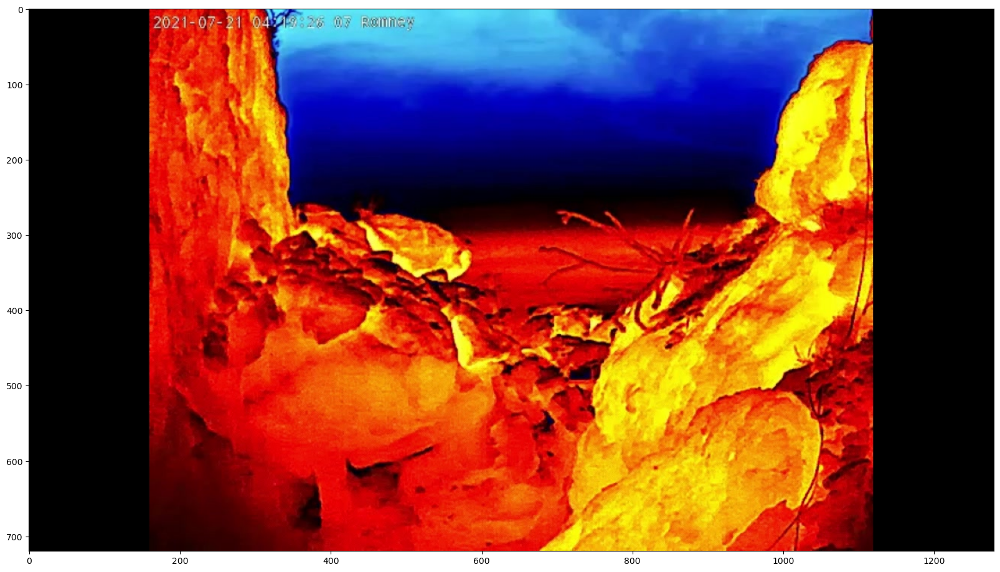

In [11]:
# Pick a Frame with no bats to serve as the Test Frame
test_ind = 160 # Frame 160 from 20210720_20210721_clip3 has no bats present
test_frame = cv2.imread(image_files[test_ind])
test_frame = cv2.cvtColor(test_frame, cv2.COLOR_BGR2RGB) #might need to change this so it's more compatible with thermal images
plt.figure(figsize=(20,20))
plt.imshow(test_frame)

In [12]:
# first_frame = 64000
# last_frame = 64690
# every_n_frames = 1

# Test Frame Selection
first_frame = 1
last_frame = 201
every_n_frames = 1

In [13]:
base_frame = cv2.imread(image_files[first_frame])

for file in image_files[first_frame+1:last_frame+1:every_n_frames]:
    new_frame = cv2.imread(file)
    base_frame = np.where(new_frame < base_frame, new_frame, base_frame)
base_frame = cv2.cvtColor(base_frame, cv2.COLOR_BGR2RGB)

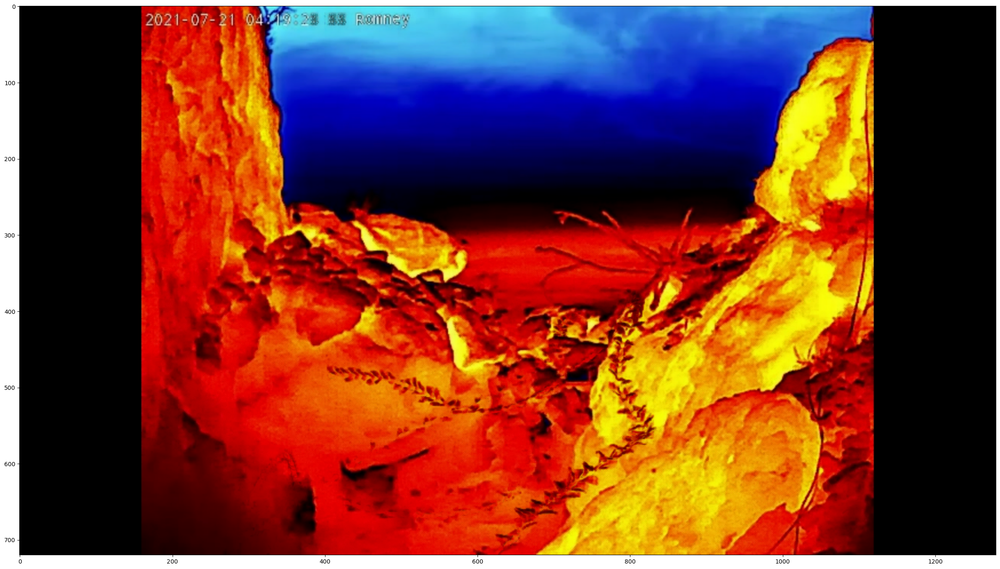

In [14]:
plt.figure(figsize=(30,30))

plt.imshow(base_frame[:,:])

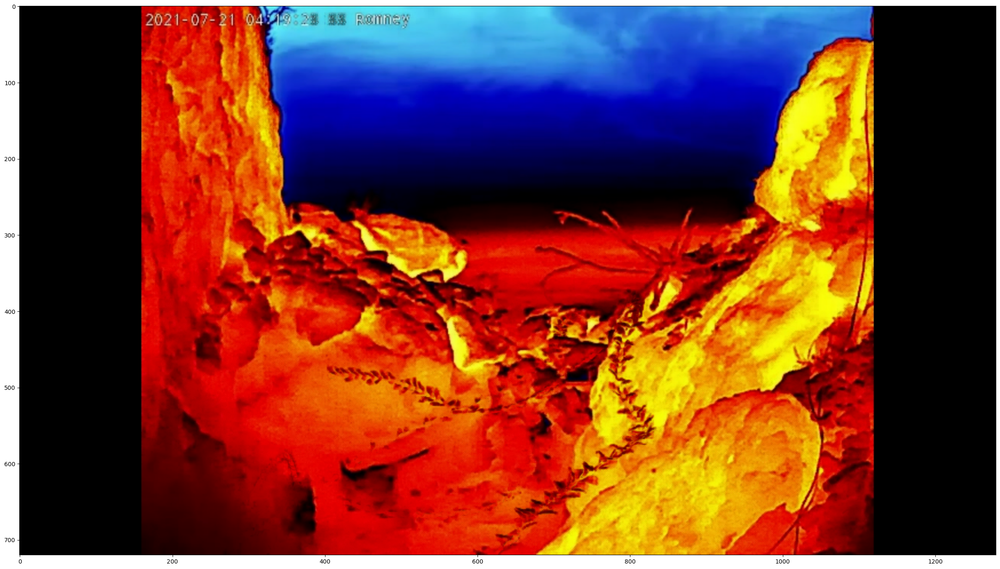

In [15]:
plt.figure(figsize=(30,30))

plt.imshow(base_frame[:,:])

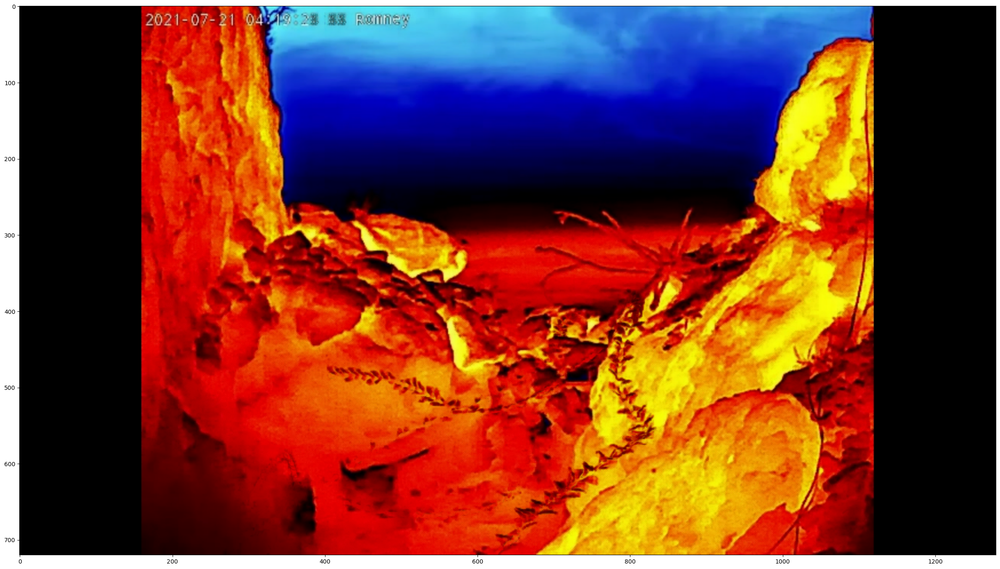

In [16]:
plt.figure(figsize=(30,30))

plt.imshow(base_frame[:,:])

In [17]:
# save_folder = '.../bat-videos/fun-videos'
save_folder = 'bat-videos\\fun-videos'
print(save_folder)

bat-videos\fun-videos


In [18]:
def get_frames(frame_files, first_frame, last_frame, imscale):
    frames = [cv2.imread(f) for f in frame_files[first_frame:last_frame]]
    for ind, frame in enumerate(frames):
        frames[ind] = cv2.resize(frame, 
                                 (frame.shape[1]//imscale, 
                                  frame.shape[0]//imscale))
    return frames

def make_frame(frames):
    base_frame = frames[0]
    for frame in frames[1:]:
        base_frame = np.where(frame < base_frame, frame, base_frame)
    return base_frame

In [19]:
# scale = 1
# first_frame = 41709
# last_frame = 46400
# speed = 1

# frames = get_frames(image_files, first_frame, last_frame, scale)

In [20]:
scale = 1
first_frame = 1
last_frame = 201
speed = 1

frames = get_frames(image_files, first_frame, last_frame, scale)

In [21]:
start_timelapse = 90
flashes = []
# flashes.extend([-i for i in range(90, 120)])
# flashes.extend([-i for i in range(130, 140)])
# flashes.extend([-i for i in range(160, 165)])
# flashes.extend([-i for i in range(175, 180)])
# flashes.extend([-i for i in range(190, 195)])
# flashes.extend([i for i in range(210, 230)])

def logn(value, n):
    return np.log(value)/np.log(n)

# n = 1.5
# flashes = [start_timelapse - i for i in range(start_timelapse, 0, -1) if i**n == int(i**n)]
# flashes = [start_timelapse - i for i in range(start_timelapse, 0, -1) if logn(i, n) == int(logn(i, n))]
start_normal = len(frames)

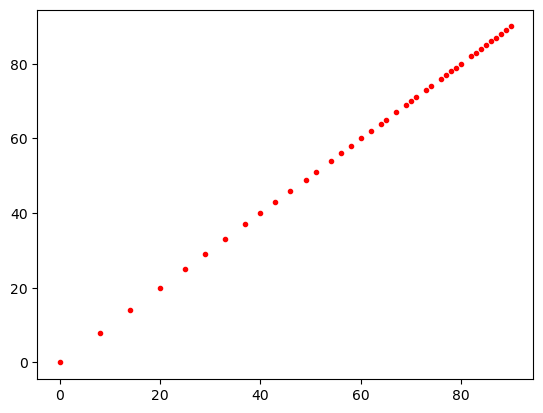

In [22]:
num_flashes = 40
flashes = np.linspace(1, 10, num_flashes)
flashes = np.log2(flashes)/np.log2(4)
flashes = flashes / np.max(flashes) * start_timelapse
flashes = flashes.astype(int)
plt.plot(flashes, flashes, 'r.')

In [23]:
speed = 2
video_outfile = os.path.join(save_folder, f'f{date}_{camera}_speed_{speed}_ff_{first_frame}_lf_{last_frame}.mp4')

fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
                               (frames[0].shape[1], frames[0].shape[0]))

base_frame = frames[0]
first_flash_group_frame = None

for ind, frame in enumerate(frames[:]):
    if ind < start_timelapse:
        if ind in flashes:
            base_frame = np.where(frame < base_frame, 
                                  frame, base_frame)
#             video_writer.write(base_frame)
            first_flash_group_frame = None
        elif -ind in flashes:
            if first_flash_group_frame is None:
                base_frame = np.where(frame < base_frame, 
                                      frame, base_frame)
#             video_writer.write(base_frame)
        else:
#             video_writer.write(base_frame)
            first_flash_group_frame = None
    elif ind < start_normal:
        if base_frame is None:
            base_frame = frame
        else:
            base_frame = np.where(frame < base_frame, 
                                  frame, base_frame)
    else:
        video_writer.write(frame)
        continue
    if ind % speed == 0:
        video_writer.write(base_frame)
    

video_writer.release()

In [24]:
# import os
# import cv2
# import numpy as np

# # Make sure frames list is not empty before proceeding
# if not frames or len(frames) == 0:
#     print("Error: No frames available to process")
# else:
#     speed = 2
#     # Use os.path.join for Windows compatibility
#     video_outfile = os.path.join(save_folder, f'f{date}_{camera}_speed_{speed}_ff_{first_frame}_lf_{last_frame}.mp4')

#     fourcc = cv2.VideoWriter_fourcc(*'mp4v')
#     # Try a more widely supported codec for Windows
#     # fourcc = cv2.VideoWriter_fourcc(*'XVID')  # Alternative: 'mp4v' if XVID doesn't work
    
#     # Check if frames[0] exists before accessing its shape
#     if len(frames) > 0:
#         video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
#                                       (frames[0].shape[1], frames[0].shape[0]))
        
#         base_frame = frames[0]
#         first_flash_group_frame = None

#         for ind, frame in enumerate(frames):
#             # Add bounds checking to prevent index errors
#             if ind < start_timelapse:
#                 if ind in flashes:
#                     base_frame = np.where(frame < base_frame, 
#                                         frame, base_frame)
#                     first_flash_group_frame = None
#                 elif -ind in flashes:
#                     if first_flash_group_frame is None:
#                         base_frame = np.where(frame < base_frame, 
#                                             frame, base_frame)
#                 else:
#                     first_flash_group_frame = None
#             elif ind < start_normal:
#                 if base_frame is None:
#                     base_frame = frame
#                 else:
#                     base_frame = np.where(frame < base_frame, 
#                                         frame, base_frame)
#             else:
#                 video_writer.write(frame)
#                 continue
            
#             if ind % speed == 0:
#                 video_writer.write(base_frame)
        
#         # Always release resources
#         # video_writer.release()
#     else:
#         print("Error: frames list is empty")

In [25]:
len(frames)

200

In [26]:
# print('starting video...')

# video_outfile = os.path.join(save_folder, f'r_{date}_{camera}_ff_{first_frame}_lf_{last_frame}.mp4')

# fourcc = cv2.VideoWriter_fourcc(*'mp4v')
# video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
#                                (frames[0].shape[1], frames[0].shape[0]))
# reverse_frames = []
# base_frame = None
# for ind, frame in enumerate(frames[::-1]):
#     if ind % 150 == 0:
#         print(f'frame {ind}')
#     if ind > normal_switch:
#         if base_frame is None:
#             base_frame = frame
#         else:
#             base_frame = np.where(frame < base_frame, frame, base_frame)
#         if ind % speed == 0:
#             reverse_frames.append(base_frame)
#     else:
#         reverse_frames.append(frame)

# for frame in reverse_frames[::-1]:
#     video_writer.write(frame)
# video_writer.release()

In [27]:
# Print status message indicating video creation is starting
print('starting video...')

# Define the output video file path by joining the save folder with a formatted filename
# The filename includes date, camera name, first frame and last frame information
video_outfile = os.path.join(save_folder, f'r_{date}_{camera}_ff_{first_frame}_lf_{last_frame}.mp4')

# Set up the video codec for MP4 format
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
# Initialize the video writer with the output file, codec, frame rate (30 fps), and frame dimensions
video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
                               (frames[0].shape[1], frames[0].shape[0]))

# Create an empty list to store the processed frames
reverse_frames = []
# Initialize base_frame as None (will be used for frame accumulation)
base_frame = None

normal_switch = len(frames) # Mallory Added. I'm not sure if it's right....

# Process frames in reverse order
for ind, frame in enumerate(frames[::-1]):
    # Print progress every 10 frames (was 150)
    if ind % 10 == 0:
        print(f'frame {ind}')
    
    # For frames after normal_switch, apply special processing
    if ind > normal_switch:
        # Initialize base_frame with the first frame in this section
        if base_frame is None:
            base_frame = frame
        else:
            # Update base_frame by taking the minimum value at each pixel position
            # This creates a "minimum intensity projection" effect
            base_frame = np.where(frame < base_frame, frame, base_frame)
        
        # Only add frames to the output at intervals defined by 'speed' variable
        # This creates a time-lapse effect
        if ind % speed == 0:
            reverse_frames.append(base_frame)
    else:
        # For frames before normal_switch, add them directly without special processing
        reverse_frames.append(frame)

# Write all processed frames to the video in reverse order (restoring original chronology)
for frame in reverse_frames[::-1]:
    video_writer.write(frame)
# Release the video writer to finalize the video file
video_writer.release()

starting video...
frame 0
frame 10
frame 20
frame 30
frame 40
frame 50
frame 60
frame 70
frame 80
frame 90
frame 100
frame 110
frame 120
frame 130
frame 140
frame 150
frame 160
frame 170
frame 180
frame 190


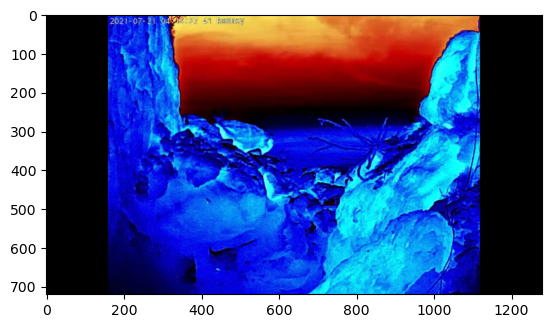

In [28]:
plt.imshow(frame)

In [29]:
## scale = 1
## first_frame = 41709
## last_frame = 46400

# scale = 2
# first_frame = 39900
# last_frame = 40890
# every_n_frames = 1

# video_outfile = os.path.join(save_folder, f'{date}_{camera}_ff_{first_frame}_lf_{last_frame}.mp4')

# base_frame = cv2.imread(image_files[first_frame])
# base_frame = cv2.resize(base_frame, 
#                         (base_frame.shape[1]//scale, 
#                          base_frame.shape[0]//scale))


# fourcc = cv2.VideoWriter_fourcc(*'mp4v')
# video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
#                                (base_frame.shape[1], base_frame.shape[0]))

# video_writer.write(base_frame)
# for file in image_files[first_frame+1:last_frame+1:every_n_frames]:
#     new_frame = cv2.imread(file)
#     new_frame = cv2.resize(new_frame, 
#                         (new_frame.shape[1]//scale, 
#                          new_frame.shape[0]//scale))
#     base_frame = np.where(new_frame < base_frame, new_frame, base_frame)
    
#     video_writer.write(base_frame)
# video_writer.release()

In [30]:
# scale = 1
# first_frame = 41709
# last_frame = 46400

scale = 2
first_frame = 80
last_frame = 291
every_n_frames = 1

video_outfile = os.path.join(save_folder, f'{date}_{camera}_ff_{first_frame}_lf_{last_frame}.mp4')

base_frame = cv2.imread(image_files[first_frame])
base_frame = cv2.resize(base_frame, 
                        (base_frame.shape[1]//scale, 
                         base_frame.shape[0]//scale))


fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_outfile, fourcc, 30.0, 
                               (base_frame.shape[1], base_frame.shape[0]))

video_writer.write(base_frame)
for file in image_files[first_frame+1:last_frame+1:every_n_frames]:
    new_frame = cv2.imread(file)
    new_frame = cv2.resize(new_frame, 
                        (new_frame.shape[1]//scale, 
                         new_frame.shape[0]//scale))
    base_frame = np.where(new_frame < base_frame, new_frame, base_frame)
    
    video_writer.write(base_frame)
video_writer.release()

In [31]:
print(np.array(base_frame.shape) // 3)

[120 213   1]


In [32]:

small = cv2.resize(base_frame, (base_frame.shape[1]//scale, base_frame.shape[0]//scale))

In [33]:
small.shape

(180, 320, 3)